<a href="https://colab.research.google.com/github/Pennywut/deepLearningHomework/blob/main/airline_passenger_satisfaction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Airline Passenger Satisfaction
The dataset contains an airline passenger satisfaction survey which the recorded data is as below.

1. Gender: Female (0) and Male (1)
2. Customer Type: Loyal customer (0) and Disloyal customer (1)
3. Age
4. Type of Travel: Personal (0) and Business (1)
5. Class: Business (0), Eco (1) and Eco plus (2)
6. Flight distance
7. Inflight wifi service: satisfaction level 0 (Not Applicable) and 1-5
8. Departure/Arrival time convenient: satisfaction level 0-5
9. Ease of online booking: satisfaction level 0-5
10. Gate location: satisfaction level 0-5
11. Food and drink: satisfaction level 0-5
12. Online boarding: satisfaction level 0-5
13. Seat comfort: satisfaction level 0-5
14. Inflight entertainment: satisfaction level 0-5
15. On-board service: satisfaction level 0-5
16. Leg room service: satisfaction level 0-5
17. Baggage handling: satisfaction level 0-5
18. Check-in service: satisfaction level 0-5
19. Inflight service: satisfaction level 0-5
20. Cleanliness: satisfaction level 0-5
21. Departure Delay in Minutes: satisfaction level 0-5
22. Arrival Delay in Minutes: satisfaction level 0-5

**Objective**: Find the factors that highly correlated to passenger satisfaction and predict the satisfaction level: Satisfied (0) and Neutral or Not satisfied (1)

## 1) Import Libraries and Data

In [ ]:
## Import Library
# data analysis
import numpy as np
import pandas as pd
import time
# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# machine learning only sklearn for this rule
import sklearn.linear_model as lm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, KFold, cross_val_score, cross_val_predict
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.metrics import accuracy_score,confusion_matrix,roc_curve, auc, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.svm import SVC
#from imblearn.over_sampling import RandomOverSampler, SMOTE
#from imblearn.under_sampling import RandomUnderSampler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier, ExtraTreesClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import RidgeClassifier, SGDClassifier
from sklearn.naive_bayes import BernoulliNB, GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, NuSVC, SVC
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier, plot_importance, XGBRFClassifier
#ignore warnings
import warnings
warnings.filterwarnings('ignore')

### 1.1) Data Cleaning

In [ ]:
## Load Data
df_alldata = pd.read_csv('https://raw.githubusercontent.com/pakkardkaw/deepLearningHomework/main/airline_train.csv') 
#df_alldata.head()

## Drop first 2 columns which not related to passenger satisfaction
df_alldata = df_alldata.drop('Unnamed: 0', axis =1)
df_alldata = df_alldata.drop('id', axis = 1)
df_alldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  object 
 1   Customer Type                      103904 non-null  object 
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  object 
 4   Class                              103904 non-null  object 
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

In [ ]:
## Fill the null value of 'Arrival Delay in Minutes' with mean
df_alldata['Arrival Delay in Minutes'] = df_alldata['Arrival Delay in Minutes'].replace(np.NaN ,df_alldata['Arrival Delay in Minutes'].mean())

In [ ]:
#plt.scatter(df_alldata['Arrival Delay in Minutes'], df_alldata['Departure Delay in Minutes'], alpha = 0.5)

## 2) EDA

In [ ]:
df_alldata.describe()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000
mean,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.640909
min,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [ ]:
df_alldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  object 
 1   Customer Type                      103904 non-null  object 
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  object 
 4   Class                              103904 non-null  object 
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

### 2.1) Histrogram

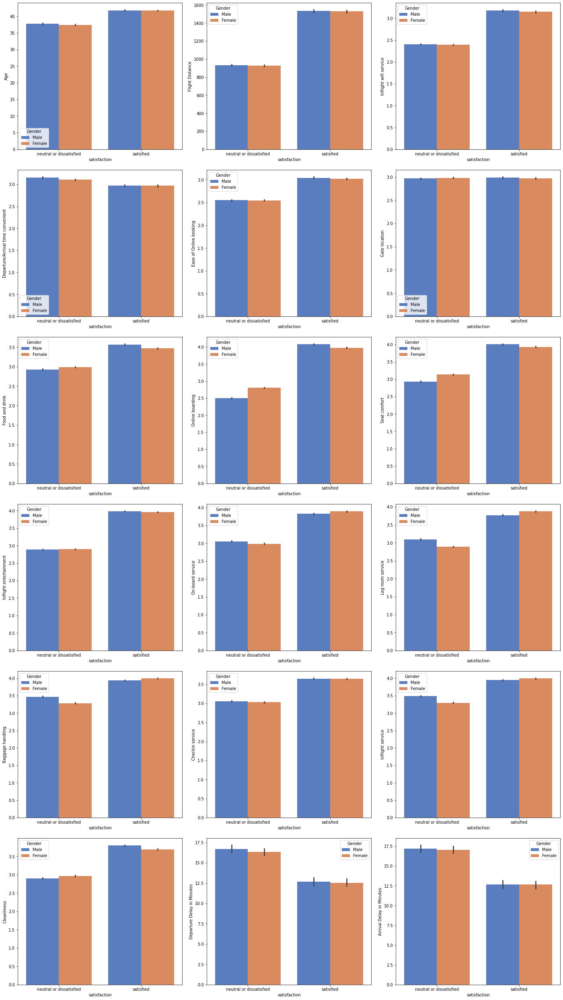

In [ ]:
numerics = ['int64','float64']
df_numeric_data = df_alldata.select_dtypes(include = numerics).columns
def detail_barplot(category):
    fig, axs = plt.subplots(6, 3, figsize=(20, 35))
    fig.tight_layout(pad=3.0)
    for feature,ax in zip(df_numeric_data,axs.ravel()):
        ax = sns.barplot(ax=ax,x="satisfaction", y=feature, hue=category,palette= 'muted', data=df_alldata)

detail_barplot('Gender')

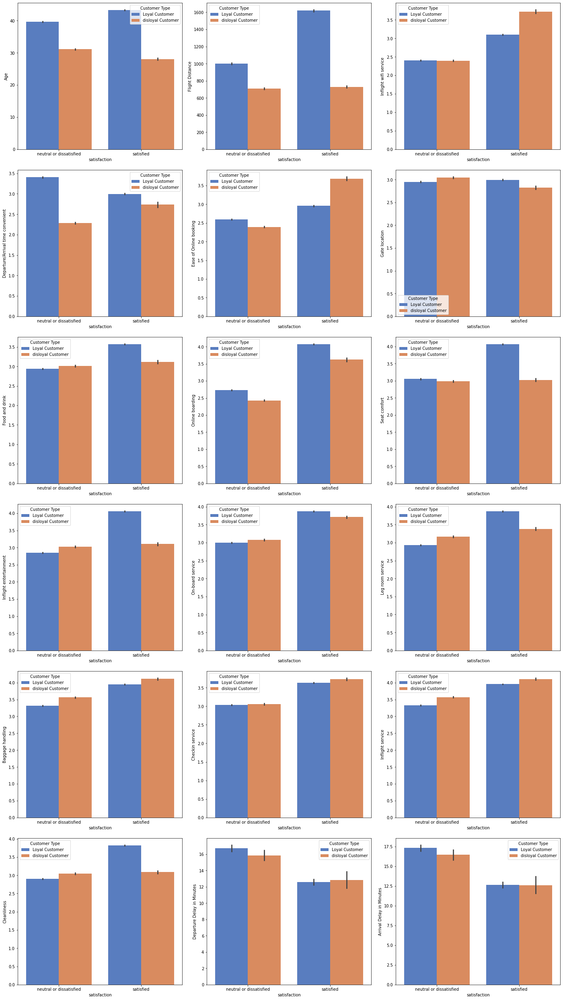

In [ ]:
numerics = ['int64','float64']
df_numeric_data = df_alldata.select_dtypes(include = numerics).columns
def detail_barplot(category):
    fig, axs = plt.subplots(6, 3, figsize=(20, 35))
    fig.tight_layout(pad=3.0)
    for feature,ax in zip(df_numeric_data,axs.ravel()):
        ax = sns.barplot(ax=ax,x="satisfaction", y=feature, hue=category,palette= 'muted', data=df_alldata)

detail_barplot('Customer Type')

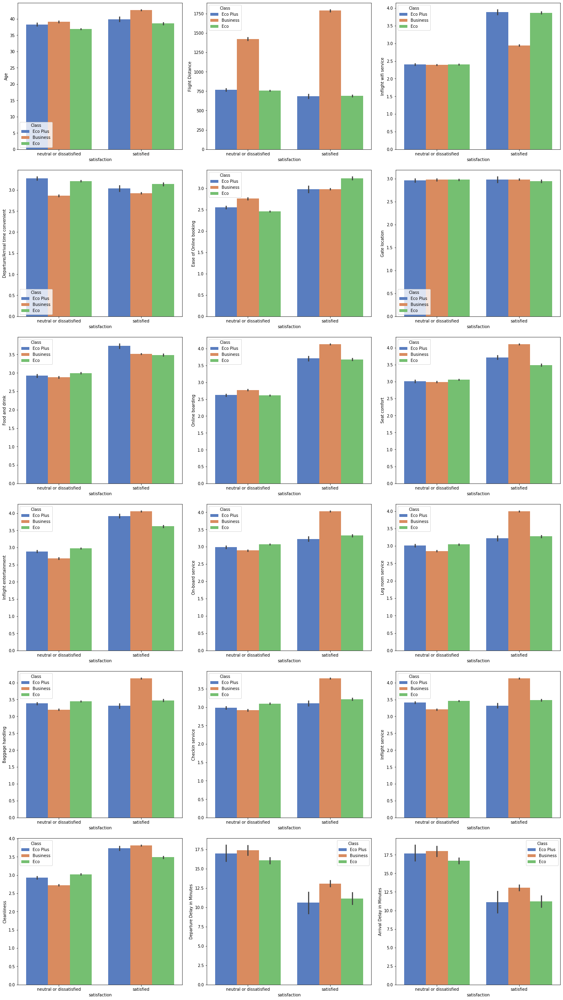

In [ ]:
numerics = ['int64','float64']
df_numeric_data = df_alldata.select_dtypes(include = numerics).columns
def detail_barplot(category):
    fig, axs = plt.subplots(6, 3, figsize=(20, 35))
    fig.tight_layout(pad=3.0)
    for feature,ax in zip(df_numeric_data,axs.ravel()):
        ax = sns.barplot(ax=ax,x="satisfaction", y=feature, hue=category,palette= 'muted', data=df_alldata)

detail_barplot('Class')

In [ ]:
for x_col in df_alldata.columns:
  fig = px.histogram(df_alldata, x=x_col, color='satisfaction',title=x_col)
  fig.show()

### 2.2) Heatmap

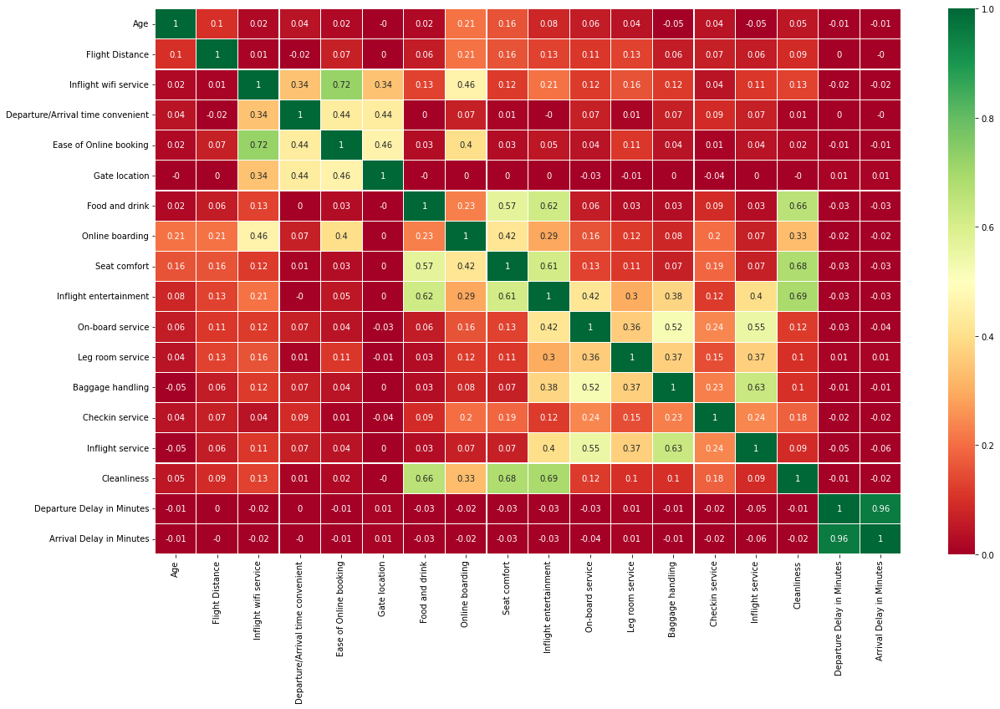

In [ ]:
sns.heatmap(df_alldata.corr().round(2),annot=True,cmap='RdYlGn',linewidths=0.2,vmin=0, vmax=1) #data.corr()-->correlation matrix
fig=plt.gcf()
fig.set_size_inches(20,12)
plt.show()

From the hestmap above, we can conclude the correlation of each factors as below.
- 'Ease_of_Online_booking' is highly correlated with 'Inflight_wifi_service' with score 0.72
- 'Cleanliness' is highly correlated with 'Food and Drink' (0.66), 'Seat comfort' (0.68) and 'Inflight entertainment' (0.69)
- 'Inflight_service" is highly correlated with 'Baggage_handling' with score 0.63 

However, there is no pair that have correlationis coefficient exactly at 1. So, there is no perfect multicollinearity based on this dataset and all variables will be used in the model.





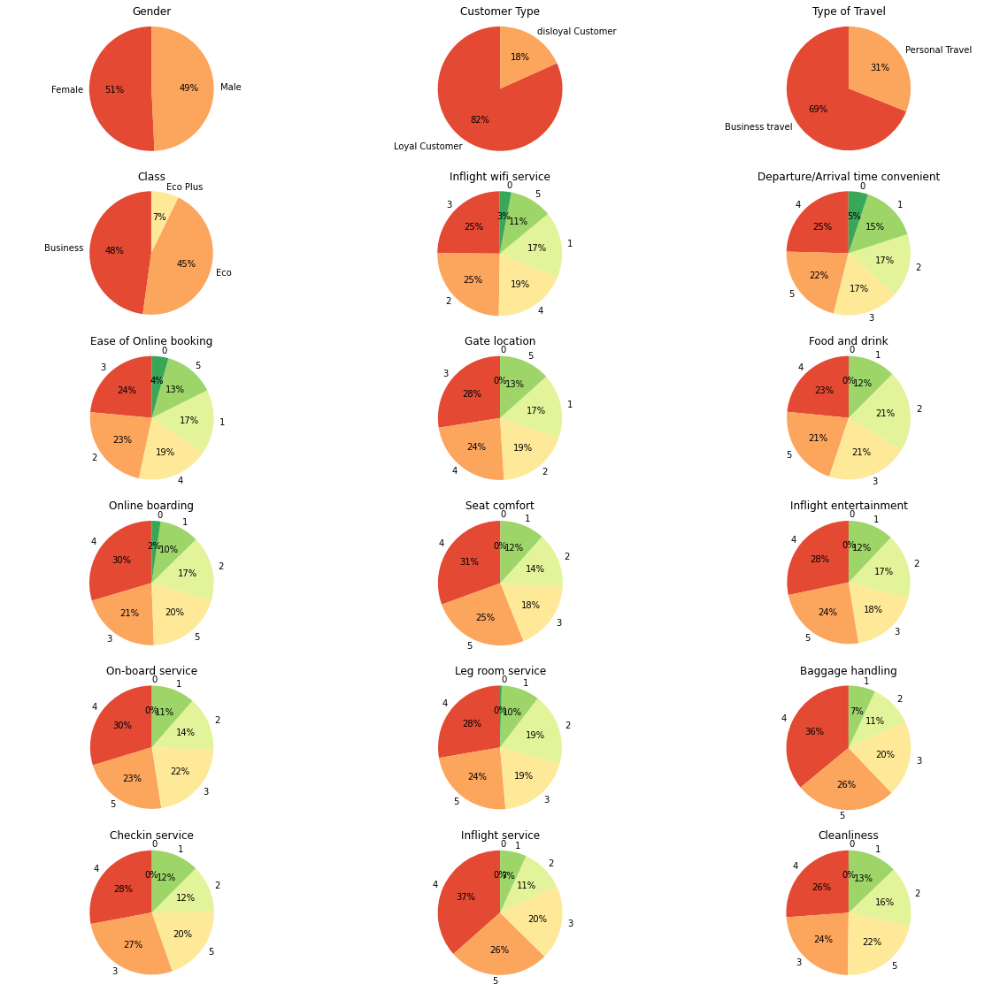

In [ ]:
cate_index = ['Gender','Customer Type','Type of Travel', 'Class', 'Inflight wifi service','Departure/Arrival time convenient','Ease of Online booking','Gate location','Food and drink','Online boarding','Seat comfort','Inflight entertainment','On-board service','Leg room service','Baggage handling','Checkin service','Inflight service','Cleanliness']

fig, axes = plt.subplots(6, 3, figsize=(20,20))
for i, col in enumerate(cate_index):
  column_values = df_alldata[col].value_counts()
  labels = column_values.index
  sizes = column_values.values
  axes[i//3, i%3].pie(sizes, labels = labels, colors = sns.color_palette("RdYlGn"), autopct = '%1.0f%%', startangle = 90)
  axes[i//3, i%3].axis('equal')
  axes[i//3, i%3].set_title(col)
plt.show()

## 3) Preprocessing

### 3.1) Encoding Data

In [ ]:
## Encode categorical data
df_alldata['Gender'] = df_alldata['Gender'].map({'Male':0,'Female':1})
df_alldata['Customer Type'] = df_alldata['Customer Type'].map({'Loyal Customer':0,'disloyal Customer':1})
df_alldata['Type of Travel'] = df_alldata['Type of Travel'].map({'Business travel':0,'Personal Travel':1})
df_alldata['Class'] = df_alldata['Class'].map({'Business':0,'Eco':1,'Eco Plus':2})
df_alldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

### 3.2) Data Imbalance Checking

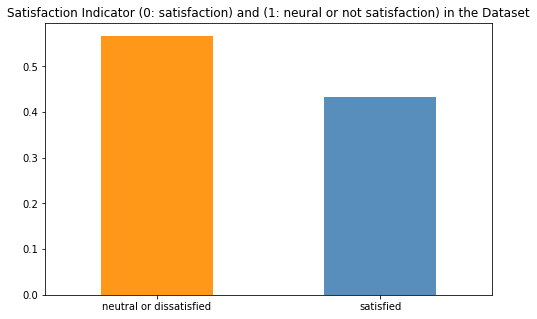

In [ ]:
## Check imbalance
fig = plt.figure(figsize = (8,5))
df_alldata.satisfaction.value_counts(normalize = True).plot(kind='bar', color= ['darkorange','steelblue'], alpha = 0.9, rot=0)
plt.title('Satisfaction Indicator (0: satisfaction) and (1: neural or not satisfaction) in the Dataset')
plt.show()

From bar chart, the data of satisfaction and neural or not satisfaction are 57% and 43%. So, the dataset is quite balanced.

In [ ]:
## Encode satisfaction

df_alldata['satisfaction'] = df_alldata['satisfaction'].map({'satisfied':0,'neutral or dissatisfied':1})
df_alldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  int64  
 1   Customer Type                      103904 non-null  int64  
 2   Age                                103904 non-null  int64  
 3   Type of Travel                     103904 non-null  int64  
 4   Class                              103904 non-null  int64  
 5   Flight Distance                    103904 non-null  int64  
 6   Inflight wifi service              103904 non-null  int64  
 7   Departure/Arrival time convenient  103904 non-null  int64  
 8   Ease of Online booking             103904 non-null  int64  
 9   Gate location                      103904 non-null  int64  
 10  Food and drink                     103904 non-null  int64  
 11  Online boarding                    1039

### 3.3) Spliting into trainig and testing datasets

In [ ]:
#Split Train Test Data

from sklearn.model_selection import train_test_split
x_all=df_alldata
y_all=df_alldata[['satisfaction']]

x_train, x_test, y_train, y_test = train_test_split(df_alldata, df_alldata[['satisfaction']],train_size=0.8,stratify=df_alldata[['satisfaction']],random_state=1)

x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train[['satisfaction']],train_size=0.875,stratify=y_train[['satisfaction']],random_state=1)


#Explore Train & Test

for x_col in x_train.columns:
    

    fig = px.histogram(x_train, x=x_col, color='satisfaction',title='Train')
    fig.show()
    fig = px.histogram(x_test, x=x_col, color='satisfaction',title='Test')
    fig.show()
    fig = px.histogram(x_valid, x=x_col, color='satisfaction',title='Validate')
    fig.show()


x_train=x_train.drop('satisfaction',axis=1)
x_test=x_test.drop('satisfaction',axis=1)
x_valid=x_valid.drop('satisfaction',axis=1)

### 3.4) Data Normalizing of train dataset

In [ ]:
#Normalize data
scaler = StandardScaler()  
scaler.fit(x_train) 
x_train = scaler.transform(x_train) 

In [ ]:
x_test = scaler.transform(x_test)
x_valid = scaler.transform(x_valid)

## 4) Machine Learning

In [ ]:
#set Seed for each repetitive
seednumber=[911,444,888]

In [ ]:
#ML Model


from sklearn.metrics import roc_auc_score, roc_curve
%matplotlib inline


best_model = None
best_model_name = ""
best_valid = 0
resultlist= pd.DataFrame([], columns=['model', 'runtime','Acc','repetition','type'])
for i in range(3):
  print("******************************************************************")
  print("********   Repetitive" +str(i) + "  Set Seed = " + str(seednumber[i]))
  models = []
  models.append(('LDA', LinearDiscriminantAnalysis()))
  models.append(('QDA', QuadraticDiscriminantAnalysis()))
  models.append(('AdaBoost', AdaBoostClassifier(random_state=seednumber[i])))
  models.append(('Bagging', BaggingClassifier(random_state=seednumber[i])))
  models.append(('Extra Trees Ensemble', ExtraTreesClassifier(random_state=seednumber[i])))
  models.append(('Gradient Boosting', GradientBoostingClassifier(random_state=seednumber[i])))
  models.append(('Random Forest', RandomForestClassifier(random_state=seednumber[i])))
  models.append(('Ridge', RidgeClassifier(random_state=seednumber[i])))
  models.append(('SGD', SGDClassifier(random_state=seednumber[i])))
  models.append(('BNB', BernoulliNB()))
  models.append(('GNB', GaussianNB()))
  models.append(('KNN', KNeighborsClassifier()))
  models.append(('MLP', MLPClassifier(random_state=seednumber[i])))
  models.append(('LSVC', LinearSVC(random_state=seednumber[i])))
  models.append(('DTC', DecisionTreeClassifier(random_state=seednumber[i])))
  models.append(('ETC', ExtraTreeClassifier(random_state=seednumber[i])))
  models.append(('XGB', XGBClassifier(objective='binary:logistic',eval_metric=['logloss'],random_state=seednumber[i])))
  models.append(('XGBRF', XGBRFClassifier(objective='binary:logistic',eval_metric=['logloss'],random_state=seednumber[i])))
  DECISION_FUNCTIONS = {"Ridge", "SGD", "LSVC", "SVC"}

  for name, model in models:
      start_time = time.time()
      model.fit(x_train, y_train)
      end_time = time.time()
      
      if name in DECISION_FUNCTIONS:
          proba = model.decision_function(x_test)
      else:
          proba = model.predict_proba(x_test)[:, 1]
      y_pred=model.predict(x_test)
      s=accuracy_score(y_test,y_pred) #f1_score(y_test, model.predict(x_test), average='weighted') 

      trainscore=accuracy_score(y_train,model.predict(x_train))
      
      #score =  roc_auc_score(y_train, proba)

      
      result = {'model': name, 'runtime': end_time - start_time, 'Acc': trainscore,'repetition' : i,'type' :'ML'}
      resultlist=resultlist.append(result, ignore_index = True)
      """
      fpr, tpr, _  = roc_curve(y_test, proba)
      plt.figure()
      plt.plot(fpr, tpr, color='darkorange', label=f"ROC curve (auc = {score})")
      plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
      plt.title(f"{name} Results")
      plt.xlabel("False Positive Rate")
      plt.ylabel("True Positive Rate")
      plt.legend(loc="lower right")
      plt.show()
      """
      print(  name+ " Accuracy =" + str(trainscore))
      print(  name+ "--- %s seconds ---" % (end_time - start_time))
      
      if trainscore > best_valid:
          best_valid = trainscore
          best_model = model
          best_model_name = name

  print(f"Best model is {best_model_name}")

******************************************************************
********   Repetitive0  Set Seed = 911
LDA Accuracy =0.8715833470824397
LDA--- 0.28014349937438965 seconds ---
QDA Accuracy =0.8574630149040312
QDA--- 0.12311291694641113 seconds ---
AdaBoost Accuracy =0.9267447615904966
AdaBoost--- 3.6315970420837402 seconds ---
Bagging Accuracy =0.9977451465654732
Bagging--- 3.3900156021118164 seconds ---
Extra Trees Ensemble Accuracy =1.0
Extra Trees Ensemble--- 7.025345802307129 seconds ---
Gradient Boosting Accuracy =0.9414013089149206
Gradient Boosting--- 13.35511326789856 seconds ---
Random Forest Accuracy =1.0
Random Forest--- 8.791695356369019 seconds ---
Ridge Accuracy =0.8716520926139801
Ridge--- 0.051508426666259766 seconds ---
SGD Accuracy =0.87561183523071
SGD--- 0.41887855529785156 seconds ---
BNB Accuracy =0.8490760600560964
BNB--- 0.06734538078308105 seconds ---
GNB Accuracy =0.8634301270417423
GNB--- 0.04168057441711426 seconds ---
KNN Accuracy =0.9474096683715558
KNN-

In [ ]:
#print(resultlist)

### 4.1) Compare Model - before tuning

In [ ]:
# Compare Machine Learning

accResult=resultlist[["model","Acc"]].groupby("model").mean().reset_index()
print(resultlist[["model","Acc"]].groupby("model").agg(['mean','std','count']))
print("********************")
print("The best model is " + accResult[accResult['Acc']==max(accResult['Acc'])]['model'])
#fig = px.scatter(resultlist, x="runtime", y="Acc", color="model",size="Acc", hover_data=['model' , 'repetition'],title='Accuracy vs Runtime for ML models')
#fig.show()


#fig = px.box(resultlist, x="model", y="Acc", points="all",title="Accuracy score for ML model")
#fig.show()

#fig = px.box(resultlist, x="model", y="runtime", points="all",title="Runtime for ML model")
#fig.show()

#print(np.argmax(y_pred))

                           Acc                
                          mean       std count
model                                         
AdaBoost              0.926745  0.000000     3
BNB                   0.849076  0.000000     3
Bagging               0.997741  0.000062     3
DTC                   1.000000  0.000000     3
ETC                   1.000000  0.000000     3
Extra Trees Ensemble  1.000000  0.000000     3
GNB                   0.863430  0.000000     3
Gradient Boosting     0.941401  0.000000     3
KNN                   0.947410  0.000000     3
LDA                   0.871583  0.000000     3
LSVC                  0.874613  0.000016     3
MLP                   0.969023  0.000450     3
QDA                   0.857463  0.000000     3
Random Forest         1.000000  0.000000     3
Ridge                 0.871652  0.000000     3
SGD                   0.871024  0.004599     3
XGB                   0.938981  0.000000     3
XGBRF                 0.890447  0.000151     3
*************

In [ ]:
#accResult=resultlist[["model","Acc"]].groupby("model").mean().reset_index()
#print(accResult)
fig = px.box(resultlist, x="model", y="Acc", points="all",title="Accuracy score for ML model")
fig.show()

fig = px.box(resultlist, x="model", y="runtime", points="all",title="Runtime for ML model")
fig.show()

Confusion matrix from the best model

In [ ]:
# confusion matrix from the best model: Extra Tree Ensemble

ETE = ExtraTreesClassifier(n_estimators=1000)
ETE.fit(x_train,y_train)
test_mse = ETE.predict(x_test)

forest_pred = ETE.predict(x_test)
print('\n',confusion_matrix(y_test, forest_pred))
print('CLASSIFICATION REPORT or Extra Tree Ensemble\n\n', classification_report(y_test, forest_pred))


 [[ 8479   526]
 [  256 11520]]
CLASSIFICATION REPORT or Extra Tree Ensemble

               precision    recall  f1-score   support

           0       0.97      0.94      0.96      9005
           1       0.96      0.98      0.97     11776

    accuracy                           0.96     20781
   macro avg       0.96      0.96      0.96     20781
weighted avg       0.96      0.96      0.96     20781



### 4.2) Tuning Model

###Tuning the Extra Tree Ensemble Classifier ML Model

In [ ]:
h_n_estimator=range(1500,2000,100)

best_score=0
best_n_estimator=0

MLTuneResultlist= pd.DataFrame([], columns=['parameter','parameter_value', 'runtime','Acc','repetition'])
for i in range(3):
  print("**************** Repetitive "+str(i)+" **")
  for n_e in h_n_estimator:
    start_time = time.time()
    clf = ExtraTreesClassifier(n_estimators=n_e,random_state=seednumber[i]).fit(x_train, y_train)
    end_time = time.time()
    s=accuracy_score(y_valid,clf.predict(x_valid)) #clf.score(x_test, y_test)
    MLTuneResult = {'parameter': 'n_estimators','parameter_value': n_e, 'runtime': end_time - start_time, 'Acc': s,'repetition' : i}
    MLTuneResultlist=MLTuneResultlist.append(MLTuneResult, ignore_index = True)
    
    print('n_estimator = '+str(n_e)+ "   Acc="+str(s))
    if s>best_score:
      best_score=s
      best_n_estimator=n_e

**************** Repetitive 0 **
n_estimator = 1500   Acc=0.9618900971994996
n_estimator = 1600   Acc=0.9621788085843519
n_estimator = 1700   Acc=0.9621788085843519
n_estimator = 1800   Acc=0.96237128284092
n_estimator = 1900   Acc=0.9625637570974882
**************** Repetitive 1 **
n_estimator = 1500   Acc=0.9624675199692041
n_estimator = 1600   Acc=0.96237128284092
n_estimator = 1700   Acc=0.9625637570974882
n_estimator = 1800   Acc=0.96237128284092
n_estimator = 1900   Acc=0.9621788085843519
**************** Repetitive 2 **
n_estimator = 1500   Acc=0.9617938600712155
n_estimator = 1600   Acc=0.9618900971994996
n_estimator = 1700   Acc=0.9618900971994996
n_estimator = 1800   Acc=0.9620825714560678
n_estimator = 1900   Acc=0.9620825714560678


In [ ]:
print('Best score =', best_score)
print('Best n_estimator =', best_n_estimator)

Best score = 0.9625637570974882
Best n_estimator = 1900


In [ ]:


print(MLTuneResultlist[['parameter','parameter_value','Acc','runtime']].groupby(['parameter','parameter_value']).agg(['mean','std']).reset_index())





      parameter parameter_value       Acc               runtime          
                                     mean       std        mean       std
0  n_estimators            1500  0.962050  0.000364  111.723196  1.175491
1  n_estimators            1600  0.962147  0.000242  117.763583  6.811697
2  n_estimators            1700  0.962211  0.000338  120.542983  0.965942
3  n_estimators            1800  0.962275  0.000167  128.440138  2.019988
4  n_estimators            1900  0.962275  0.000255  139.261418  6.980783


### 4.3) Compare Model after tuning

In [ ]:
FinalResultList= pd.DataFrame([], columns=['model', 'train time', 'inference time','Acc','repetition','type'])
MLCompareDataSetResultlist= pd.DataFrame([], columns=['data set','train time', 'inference time','Acc','records','repetition'])

for i in range(3):
  train_start_time = time.time()
  clf = ExtraTreesClassifier(n_estimators=best_n_estimator,random_state=seednumber[i]).fit(x_train, y_train)
  train_end_time = time.time()
  inference_start_time = time.time()
  s=clf.score(x_train, y_train)
  inference_end_time = time.time()
  result = {'data set': 'train', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'records' : x_train.shape[0],'repetition' : i }
  MLCompareDataSetResultlist=MLCompareDataSetResultlist.append(result, ignore_index = True)
  inference_start_time = time.time()
  s=clf.score(x_valid, y_valid)
  inference_end_time = time.time()
  result = {'data set': 'validate', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'records' : x_valid.shape[0],'repetition' : i }
  MLCompareDataSetResultlist=MLCompareDataSetResultlist.append(result, ignore_index = True)
  inference_start_time = time.time()
  s=clf.score(x_test, y_test)
  inference_end_time = time.time()
  result = {'data set': 'test', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'records' : x_test.shape[0],'repetition' : i }
  MLCompareDataSetResultlist=MLCompareDataSetResultlist.append(result, ignore_index = True)

  
  result = {'model': 'ExtraTreesClassifier', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'repetition' : i,'type' :'ML'}
  FinalResultList=FinalResultList.append(result, ignore_index = True)

  print(confusion_matrix(y_test,clf.predict(x_test)))

[[ 8472   533]
 [  254 11522]]
[[ 8482   523]
 [  252 11524]]
[[ 8476   529]
 [  256 11520]]


In [ ]:
######################################################
## To fill result in Train vs Validation vs Test table
########################################################
print(MLCompareDataSetResultlist[['data set','train time', 'inference time','Acc','records']].groupby('data set').agg(['mean','std']).reset_index())

   data set train time           inference time                 Acc            \
                  mean       std           mean       std      mean       std   
0      test  139.36094  3.976113      11.120211  0.163852  0.962353  0.000309   
1     train  139.36094  3.976113      36.698418  0.279052  1.000000  0.000000   
2  validate  139.36094  3.976113       5.802861  0.152847  0.962275  0.000255   

   records       
      mean  std  
0  20781.0  0.0  
1  72732.0  0.0  
2  10391.0  0.0  


## 5) Deep Learning

In [1]:
!nvidia-smi -L
import tensorflow as tf
print( f"TensorFlow {tf.__version__}" )
print( f"tf.keras.backend.image_data_format() = {tf.keras.backend.image_data_format()}" )

# Count the number of GPUs as detected by tensorflow
gpus = tf.config.list_physical_devices('GPU')
print( f"TensorFlow detected { len(gpus) } GPU(s):" )
for i, gpu in enumerate(gpus):
  print( f".... GPU No. {i}: Name = {gpu.name} , Type = {gpu.device_type}" )



GPU 0: Tesla T4 (UUID: GPU-0810d131-3d58-d963-912e-a3331f715581)
TensorFlow 2.8.2
tf.keras.backend.image_data_format() = channels_last
TensorFlow detected 1 GPU(s):
.... GPU No. 0: Name = /physical_device:GPU:0 , Type = GPU


### 5.1) Change Data Type

In [ ]:
#Change data type into float32 which most DL frameworks use as a default
x_traindp = x_train.astype(np.float32)
x_testdp = x_test.astype(np.float32)
x_validdp = x_valid.astype(np.float32)

y_traindp = y_train.to_numpy()
y_testdp = y_test.to_numpy()
y_validdp = y_valid.to_numpy()

### 5.2) Create Networking Architecture

In [ ]:
model = tf.keras.models.Sequential()

input_dim = x_train.shape[1]    
output_dim = 2

# Input layer
model.add( tf.keras.Input(shape=(input_dim,)) )

# Hidden layer
model.add( tf.keras.layers.Dense(32, activation='relu', name='hidden1') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.BatchNormalization(axis=-1, name='bn1') )  
model.add( tf.keras.layers.Dense(64, activation='relu', name='hidden2') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.BatchNormalization(axis=-1, name='bn2') )
model.add( tf.keras.layers.Dense(32, activation='relu', name='hidden3') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.Dropout(0.3) )                        # drop rate = 30%

# Output layer
model.add( tf.keras.layers.Dense(output_dim, activation='softmax', name='output') )

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden1 (Dense)             (None, 32)                736       
                                                                 
 bn1 (BatchNormalization)    (None, 32)                128       
                                                                 
 hidden2 (Dense)             (None, 64)                2112      
                                                                 
 bn2 (BatchNormalization)    (None, 64)                256       
                                                                 
 hidden3 (Dense)             (None, 32)                2080      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 output (Dense)              (None, 2)                

### 5.3) Compile the Model

In [ ]:
#create function to calculate f1
from keras import backend as K

# Compile with default values for both optimizer and loss
model.compile( optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['acc'] )
# Compile + hyperparameter tuning
model.compile( optimizer=tf.keras.optimizers.Adam(learning_rate=0.001) , 
                       loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False) ,
                       metrics=['acc'] 
                     )

### 5.4) Tune batch size (32,64,128)

In [ ]:
h_batch_size=[32,64,128]

DLTuneResultlist= pd.DataFrame([], columns=['parameter','parameter_value', 'runtime','Acc','repetition'])
best_batch_number=h_batch_size[0]
best_s=0
for i in range(1):
  
  np.random.seed(seednumber[i])
  tf.random.set_seed(seednumber[i])

  for h_n in h_batch_size:
    checkpoint_filepath = "bestmodel_epoch{epoch:02d}_valloss{val_loss:.2f}.hdf5"
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( filepath=checkpoint_filepath,
                                                                                                  save_weights_only=True,
                                                                                                  monitor='val_acc',
                                                                                                  mode='max',
                                                                                                  save_best_only=True)

    start_time = time.time()
    history = model.fit ( x_traindp, y_traindp, batch_size=h_n, epochs=100, verbose=1, validation_split=0.3, callbacks=[model_checkpoint_callback] )
    end_time = time.time()

    y_pred = model.predict( x_validdp)
    s=accuracy_score(y_validdp,np.argmax(y_pred,axis = 1)) #f1_score(y_test, np.argmax(y_pred,axis = 1), average='weighted') 
    print(s)

    if s>best_s:
      best_s=s
      best_batch_number=h_n

    DLTuneResult = {'parameter': 'h_batch_size','parameter_value': h_n, 'runtime': end_time - start_time, 'Acc': s,'repetition' : i}
    DLTuneResultlist=DLTuneResultlist.append(DLTuneResult, ignore_index = True)

print(DLTuneResultlist[['parameter','parameter_value','Acc','runtime']].groupby(['parameter','parameter_value']).agg(['mean','std','count']).reset_index())
print('Best batch size = ' + str(best_batch_number))


Epoch 1/100
1591/1591 [==============================] - 6s 3ms/step - loss: 0.2787 - acc: 0.8860 - val_loss: 0.1558 - val_acc: 0.9365
Epoch 2/100
1591/1591 [==============================] - 5s 3ms/step - loss: 0.1823 - acc: 0.9270 - val_loss: 0.1346 - val_acc: 0.9445
Epoch 3/100
1591/1591 [==============================] - 5s 3ms/step - loss: 0.1598 - acc: 0.9368 - val_loss: 0.1266 - val_acc: 0.9486
Epoch 4/100
1591/1591 [==============================] - 5s 3ms/step - loss: 0.1462 - acc: 0.9419 - val_loss: 0.1139 - val_acc: 0.9518
Epoch 5/100
1591/1591 [==============================] - 5s 3ms/step - loss: 0.1382 - acc: 0.9447 - val_loss: 0.1103 - val_acc: 0.9524
Epoch 6/100
1591/1591 [==============================] - 5s 3ms/step - loss: 0.1329 - acc: 0.9463 - val_loss: 0.1095 - val_acc: 0.9524
Epoch 7/100
1591/1591 [==============================] - 5s 3ms/step - loss: 0.1294 - acc: 0.9472 - val_loss: 0.1065 - val_acc: 0.9539
Epoch 8/100
1591/1591 [==============================] 

### 5.5) Tune Epoch (50,100,300)

In [ ]:
h_Epoch=[50,100,300]
best_Epoch=h_Epoch[0]
best_s=0


for i in range(1):
  
  np.random.seed(seednumber[i])
  tf.random.set_seed(seednumber[i])

  for h_n in h_Epoch:
    checkpoint_filepath = "bestmodel_epoch{epoch:02d}_valloss{val_loss:.2f}.hdf5"
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( filepath=checkpoint_filepath,
                                                                                                  save_weights_only=True,
                                                                                                  monitor='val_acc',
                                                                                                  mode='max',
                                                                                                  save_best_only=True)

    start_time = time.time()
    history = model.fit ( x_traindp, y_traindp, batch_size=best_batch_number, epochs=h_n, verbose=1, validation_split=0.3, callbacks=[model_checkpoint_callback] )
    end_time = time.time()

    y_pred = model.predict( x_validdp)
    s=accuracy_score(y_validdp,np.argmax(y_pred,axis = 1)) #f1_score(y_test, np.argmax(y_pred,axis = 1), average='weighted') 
    print(s)
    if s>best_s:
      best_s=s
      best_Epoch=h_n


    DLTuneResult = {'parameter': 'h_epoch','parameter_value': h_n, 'runtime': end_time - start_time, 'Acc': s,'repetition' : i}
    DLTuneResultlist=DLTuneResultlist.append(DLTuneResult, ignore_index = True)

print(DLTuneResultlist[['parameter','parameter_value','Acc','runtime']].groupby(['parameter','parameter_value']).agg(['mean','std','count']).reset_index())

print('Best Epoch = ' + str(best_Epoch))

Epoch 1/50
1591/1591 [==============================] - 5s 3ms/step - loss: 0.0933 - acc: 0.9609 - val_loss: 0.1096 - val_acc: 0.9553
Epoch 2/50
1591/1591 [==============================] - 5s 3ms/step - loss: 0.0855 - acc: 0.9633 - val_loss: 0.1068 - val_acc: 0.9572
Epoch 3/50
1591/1591 [==============================] - 5s 3ms/step - loss: 0.0865 - acc: 0.9628 - val_loss: 0.1085 - val_acc: 0.9568
Epoch 4/50
1591/1591 [==============================] - 5s 3ms/step - loss: 0.0837 - acc: 0.9642 - val_loss: 0.1055 - val_acc: 0.9572
Epoch 5/50
1591/1591 [==============================] - 5s 3ms/step - loss: 0.0842 - acc: 0.9638 - val_loss: 0.1027 - val_acc: 0.9556
Epoch 6/50
1591/1591 [==============================] - 5s 3ms/step - loss: 0.0827 - acc: 0.9640 - val_loss: 0.1022 - val_acc: 0.9570
Epoch 7/50
1591/1591 [==============================] - 6s 4ms/step - loss: 0.0848 - acc: 0.9633 - val_loss: 0.1031 - val_acc: 0.9570
Epoch 8/50
1591/1591 [==============================] - 5s 3ms

### 5.6) Tune optimizer (Adam,Adamaz,Nadam)

In [ ]:
model = tf.keras.models.Sequential()

input_dim = x_train.shape[1]    
output_dim = 2

# Input layer
model.add( tf.keras.Input(shape=(input_dim,)) )

# Hidden layer
model.add( tf.keras.layers.Dense(32, activation='relu', name='hidden1') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.BatchNormalization(axis=-1, name='bn1') )  
model.add( tf.keras.layers.Dense(64, activation='relu', name='hidden2') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.BatchNormalization(axis=-1, name='bn2') )
model.add( tf.keras.layers.Dense(32, activation='relu', name='hidden3') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.Dropout(0.3) )                        # drop rate = 30%

# Output layer
model.add( tf.keras.layers.Dense(output_dim, activation='softmax', name='output') )

model.summary()

#create function to calculate f1
from keras import backend as K
h_optimizer=['Adam','Adamax','Nadam']
best_s=0
best_optimizer=h_optimizer[0]
for h_n in h_optimizer:
  # Compile with default values for both optimizer and loss
  model.compile( optimizer=h_n, loss='sparse_categorical_crossentropy', metrics=['acc'] )
  # Compile + hyperparameter tuning
  model.compile( optimizer=tf.keras.optimizers.Adam(learning_rate=0.001) , 
                        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False) ,
                        metrics=['acc'] 
                      )


  for i in range(1):
    checkpoint_filepath = "bestmodel_epoch{epoch:02d}_valloss{val_loss:.2f}.hdf5"
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( filepath=checkpoint_filepath,
                                                                                                  save_weights_only=True,
                                                                                                  monitor='val_acc',
                                                                                                  mode='max',
                                                                                                  save_best_only=True)

    start_time = time.time()
    history = model.fit ( x_traindp, y_traindp, batch_size=best_batch_number, epochs=best_Epoch, verbose=1, validation_split=0.3, callbacks=[model_checkpoint_callback] )
    end_time = time.time()

    y_pred = model.predict( x_validdp)
    s=accuracy_score(y_validdp,np.argmax(y_pred,axis = 1)) #f1_score(y_test, np.argmax(y_pred,axis = 1), average='weighted') 
    print(s)

    if s>best_s:
      best_s=s
      best_optimizer=h_n


    DLTuneResult = {'parameter': 'optimizer','parameter_value': h_n, 'runtime': end_time - start_time, 'Acc': s,'repetition' : i}
    DLTuneResultlist=DLTuneResultlist.append(DLTuneResult, ignore_index = True)

print(DLTuneResultlist[['parameter','parameter_value','Acc','runtime']].groupby(['parameter','parameter_value']).agg(['mean','std','count']).reset_index())

print('Best Optimizer = ' + str(best_optimizer))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden1 (Dense)             (None, 32)                736       
                                                                 
 bn1 (BatchNormalization)    (None, 32)                128       
                                                                 
 hidden2 (Dense)             (None, 64)                2112      
                                                                 
 bn2 (BatchNormalization)    (None, 64)                256       
                                                                 
 hidden3 (Dense)             (None, 32)                2080      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 output (Dense)              (None, 2)                

### 5.7) Inference on train, validate and test dataset

In [ ]:
DLCompareDataSetResultlist= pd.DataFrame([], columns=['data set','train time', 'inference time','Acc','records','repetition'])

model = tf.keras.models.Sequential()

input_dim = x_train.shape[1]    
output_dim = 2

# Input layer
model.add( tf.keras.Input(shape=(input_dim,)) )

# Hidden layer
model.add( tf.keras.layers.Dense(32, activation='relu', name='hidden1') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.BatchNormalization(axis=-1, name='bn1') )  
model.add( tf.keras.layers.Dense(64, activation='relu', name='hidden2') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.BatchNormalization(axis=-1, name='bn2') )
model.add( tf.keras.layers.Dense(32, activation='relu', name='hidden3') )   # use default weight initialization, don't use any regularization
model.add( tf.keras.layers.Dropout(0.3) )                        # drop rate = 30%

# Output layer
model.add( tf.keras.layers.Dense(output_dim, activation='softmax', name='output') )

model.summary()

#create function to calculate f1
from keras import backend as K

# Compile with default values for both optimizer and loss
model.compile( optimizer=best_optimizer, loss='sparse_categorical_crossentropy', metrics=['acc'] )
# Compile + hyperparameter tuning
model.compile( optimizer=tf.keras.optimizers.Adam(learning_rate=0.001) , 
                       loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False) ,
                       metrics=['acc'] 
                     )


for i in range(3):
  np.random.seed(seednumber[i])
  tf.random.set_seed(seednumber[i])
  checkpoint_filepath = "bestmodel_epoch{epoch:02d}_valloss{val_loss:.2f}.hdf5"
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint( filepath=checkpoint_filepath,
                                                                                                save_weights_only=True,
                                                                                                monitor='val_acc',
                                                                                                mode='max',
                                                                                                save_best_only=True)

  train_start_time = time.time()
  history = model.fit ( x_traindp, y_traindp, batch_size=best_batch_number, epochs=best_Epoch, verbose=1, validation_split=0.3, callbacks=[model_checkpoint_callback] )
  train_end_time = time.time()

  inference_start_time = time.time()
  y_pred = model.predict( x_traindp)
  inference_end_time = time.time()
  s=accuracy_score(y_traindp,np.argmax(y_pred,axis = 1)) #f1_score(y_test, np.argmax(y_pred,axis = 1), average='weighted') 
  print(s)

  result = {'data set': 'train', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'records' : x_traindp.shape[0],'repetition' : i }
  DLCompareDataSetResultlist=DLCompareDataSetResultlist.append(result, ignore_index = True)

  inference_start_time = time.time()
  y_pred = model.predict( x_validdp)
  inference_end_time = time.time()
  s=accuracy_score(y_validdp,np.argmax(y_pred,axis = 1)) #f1_score(y_test, np.argmax(y_pred,axis = 1), average='weighted') 
  print(s)

  result = {'data set': 'validation', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'records' : x_validdp.shape[0],'repetition' : i }
  DLCompareDataSetResultlist=DLCompareDataSetResultlist.append(result, ignore_index = True)

  inference_start_time = time.time()
  y_pred = model.predict( x_testdp)
  inference_end_time = time.time()
  s=accuracy_score(y_testdp,np.argmax(y_pred,axis = 1)) #f1_score(y_test, np.argmax(y_pred,axis = 1), average='weighted') 
  print(s)

  result = {'data set': 'test', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'records' : x_testdp.shape[0],'repetition' : i }
  DLCompareDataSetResultlist=DLCompareDataSetResultlist.append(result, ignore_index = True)



  
  result = {'model': 'Deeplearning', 'train time': train_end_time - train_start_time,'inference time': inference_end_time-inference_start_time, 'Acc': s,'repetition' : i,'type' :'DL'}
  FinalResultList=FinalResultList.append(result, ignore_index = True)

  print(confusion_matrix(y_test,clf.predict(x_test)))





Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden1 (Dense)             (None, 32)                736       
                                                                 
 bn1 (BatchNormalization)    (None, 32)                128       
                                                                 
 hidden2 (Dense)             (None, 64)                2112      
                                                                 
 bn2 (BatchNormalization)    (None, 64)                256       
                                                                 
 hidden3 (Dense)             (None, 32)                2080      
                                                                 
 dropout_2 (Dropout)         (None, 32)                0         
                                                                 
 output (Dense)              (None, 2)                

In [ ]:
#################
## To fill in  Train vs Validation vs Test
#######################

print(DLCompareDataSetResultlist[['data set','train time', 'inference time','Acc','records']].groupby('data set').agg(['mean','std']).reset_index())

     data set train time            inference time                 Acc  \
                    mean        std           mean       std      mean   
0        test  522.80429  22.636121       0.975127  0.287878  0.962867   
1       train  522.80429  22.636121       4.386087  1.376126  0.967062   
2  validation  522.80429  22.636121       0.588250  0.144278  0.963975   

             records       
        std     mean  std  
0  0.000949  20781.0  0.0  
1  0.001088  72732.0  0.0  
2  0.000619  10391.0  0.0  


total 2788
-rw-r--r-- 1 root root 48544 Sep  5 18:09 bestmodel_epoch66_valloss0.10.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:04 bestmodel_epoch17_valloss0.10.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:03 bestmodel_epoch04_valloss0.09.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:03 bestmodel_epoch03_valloss0.10.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:03 bestmodel_epoch02_valloss0.10.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:03 bestmodel_epoch01_valloss0.10.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:02 bestmodel_epoch94_valloss0.10.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:01 bestmodel_epoch90_valloss0.09.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 18:01 bestmodel_epoch86_valloss0.09.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 17:56 bestmodel_epoch29_valloss0.10.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 17:55 bestmodel_epoch19_valloss0.09.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 17:54 bestmodel_epoch07_valloss0.09.hdf5
-rw-r--r-- 1 root root 48544 Sep  5 17:54 bestmodel_epoch02_vallo

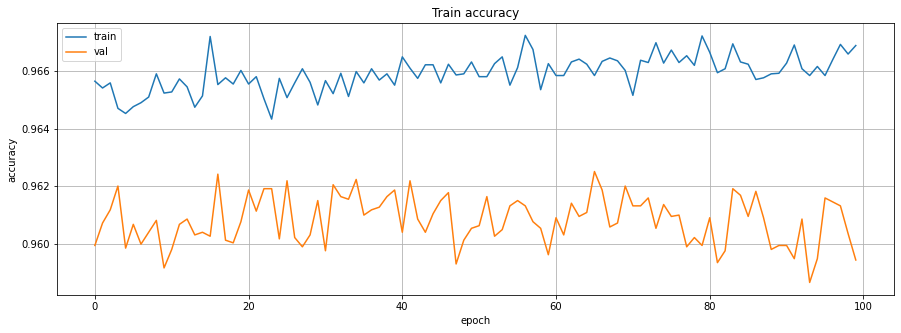

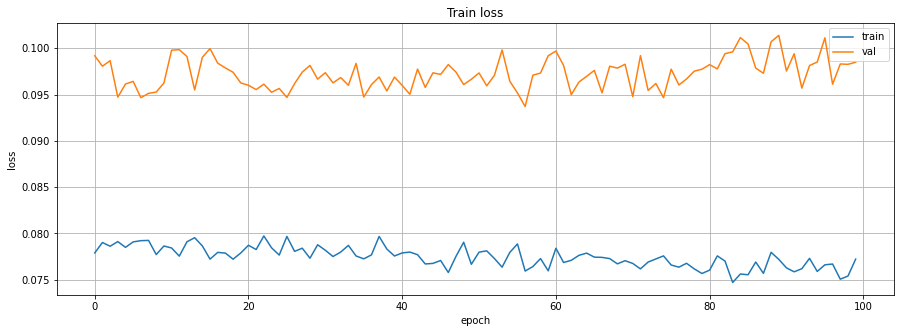

In [ ]:
#######################################################################
# Inspect the saved files (sorted by modification date, newest first)
!ls -lt

history.history.keys()
# Summarize history for accuracy
plt.figure(figsize=(15,5))
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Train accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.grid()
plt.show()

# Summarize history for loss
plt.figure(figsize=(15,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Train loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.grid()
plt.show()

## 6) Compare all ML and DL Models

In [ ]:
#Compare ML result after tune


print(FinalResultList[['model','Acc','train time', 'inference time']].groupby('model').agg(['mean','std']))

fig = px.scatter(FinalResultList, x="train time", y="Acc", color="type",size="Acc", hover_data=['model' , 'repetition'],title='Accuracy vs Runtime for ML models',symbol = 'model')
fig.show()


fig = px.box(FinalResultList, x="model", y="Acc", points="all",title="Acc score for ML model",color="type")
fig.show()

fig = px.box(FinalResultList, x="model", y="train time", points="all",title="Train time for ML model",color="type")
fig.show()

fig = px.box(FinalResultList, x="model", y="inference time", points="all",title="Inference time for ML model",color="type")
fig.show()

                           Acc           train time            inference time  \
                          mean       std       mean        std           mean   
model                                                                           
Deeplearning          0.962867  0.000949  522.80429  22.636121       0.975127   
ExtraTreesClassifier  0.962353  0.000309  139.36094   3.976113      11.120211   

                                
                           std  
model                           
Deeplearning          0.287878  
ExtraTreesClassifier  0.163852  
